In [ ]:
from google.colab import drive

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn  import svm
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from imblearn.over_sampling import SMOTE
from collections import Counter
from sklearn.decomposition import PCA
from yellowbrick.classifier import ConfusionMatrix


In [ ]:
df=pd.read_csv("/content/drive/MyDrive/fproject.csv")
df.head()

<ipython-input-13-1bf808a51ab5>:1: DtypeWarning: Columns (774,2012) have mixed types. Specify dtype option on import or set low_memory=False.
  df=pd.read_csv("/content/drive/MyDrive/fproject.csv")


,LABEL,FLUX.1,FLUX.2,FLUX.3,FLUX.4,FLUX.5,FLUX.6,FLUX.7,FLUX.8,FLUX.9,...,i,z,run_ID,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID
0,2.0,93.85,83.81,20.10,-26.98,-39.56,-124.71,-135.18,-96.27,-79.89,...,19.16573,18.79371,3606,79,6.540000e+18,GALAXY,0.634794,5812,56354,171
1,2.0,-38.88,-33.83,-58.54,-40.09,-79.31,-72.81,-86.55,-85.33,-83.97,...,21.16812,21.61427,4518,119,1.180000e+19,GALAXY,0.779136,10445,58158,427
2,2.0,532.64,535.92,513.73,496.92,456.45,466.00,464.50,486.39,436.56,...,19.34857,18.94827,3606,120,5.150000e+18,GALAXY,0.644195,4576,55592,299
3,2.0,326.52,347.39,302.35,298.13,317.74,312.70,322.33,311.31,312.42,...,20.50454,19.25010,4192,214,1.030000e+19,GALAXY,0.932346,9149,58039,775
4,2.0,-1107.21,-1112.59,-1118.95,-1095.10,-1057.55,-1034.48,-998.34,-1022.71,-989.57,...,15.97711,15.54461,8102,137,6.890000e+18,GALAXY,0.116123,6121,56187,842


In [ ]:
df.columns

Index(['LABEL', 'FLUX.1', 'FLUX.2', 'FLUX.3', 'FLUX.4', 'FLUX.5', 'FLUX.6',
       'FLUX.7', 'FLUX.8', 'FLUX.9',
       ...
       'i', 'z', 'run_ID', 'field_ID', 'spec_obj_ID', 'class', 'redshift',
       'plate', 'MJD', 'fiber_ID'],
      dtype='object', length=3214)

In [ ]:
df.dtypes

LABEL       float64
FLUX.1      float64
FLUX.2      float64
FLUX.3      float64
FLUX.4      float64
             ...   
class        object
redshift    float64
plate         int64
MJD           int64
fiber_ID      int64
Length: 3214, dtype: object

In [ ]:
df.duplicated()

0        False
1        False
2        False
3        False
4        False
         ...  
99995    False
99996    False
99997    False
99998    False
99999    False
Length: 100000, dtype: bool

In [ ]:
df.nunique()

LABEL           2
FLUX.1       4641
FLUX.2       4601
FLUX.3       4599
FLUX.4       4563
            ...  
class           3
redshift    94677
plate        6284
MJD          2180
fiber_ID     1000
Length: 3214, dtype: int64

In [ ]:
df.count()

LABEL         5087
FLUX.1        5087
FLUX.2        5087
FLUX.3        5087
FLUX.4        5087
             ...  
class       100000
redshift    100000
plate       100000
MJD         100000
fiber_ID    100000
Length: 3214, dtype: int64

In [ ]:
df.isna().all()

LABEL       False
FLUX.1      False
FLUX.2      False
FLUX.3      False
FLUX.4      False
            ...  
class       False
redshift    False
plate       False
MJD         False
fiber_ID    False
Length: 3214, dtype: bool

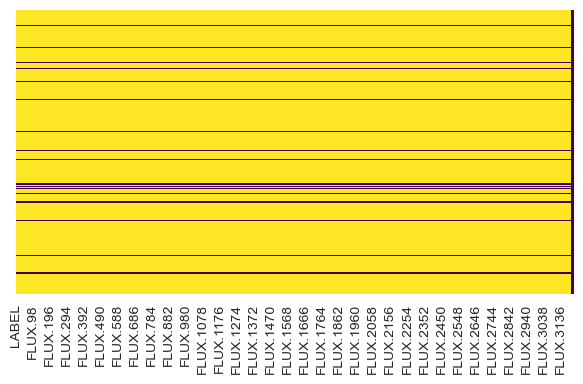

In [ ]:
sample_df = df.sample(n=1000)  # Adjust the sample size as needed

def get_heatmap(df):
    # This function gives heatmap of all NaN values
    plt.figure(figsize=(6,4))
    sns.heatmap(df.isnull(), yticklabels=False, cbar=False, cmap='viridis')
    plt.tight_layout()
    plt.show()

get_heatmap(sample_df)

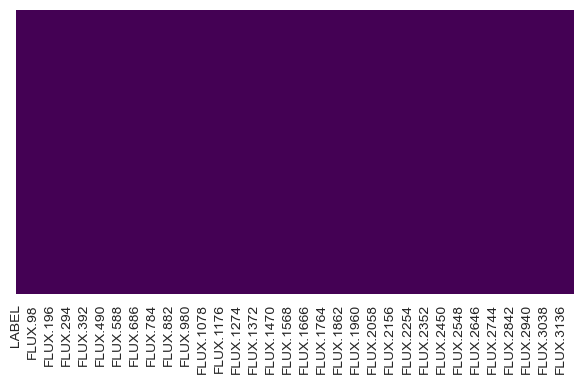

In [ ]:
sample_df = df.sample(n=1000)  # Adjust the sample size as needed
sample_df = sample_df.dropna()  # Remove rows with NaN values

def get_heatmap(df):
    # This function gives heatmap of all NaN values
    plt.figure(figsize=(6,4))
    sns.heatmap(df.isnull(), yticklabels=False, cbar=False, cmap='viridis')
    plt.tight_layout()
    plt.show()

get_heatmap(sample_df)

In [ ]:
# Splitting the DataFrame into two separate DataFrames
df1 = df.iloc[:, :3198]  # Selecting the first 3198 columns
df2 = df.iloc[:, 3198:]  # Selecting the remaining columns starting from index 3198

# Checking the shapes of the new DataFrames
print("Shape of df1:", df1.shape)
print("Shape of df2:", df2.shape)


Shape of df1: (100000, 3198)
Shape of df2: (100000, 16)


<AxesSubplot:title={'center':'Boxplot for df1'}>

<Figure size 2500x2500 with 0 Axes>

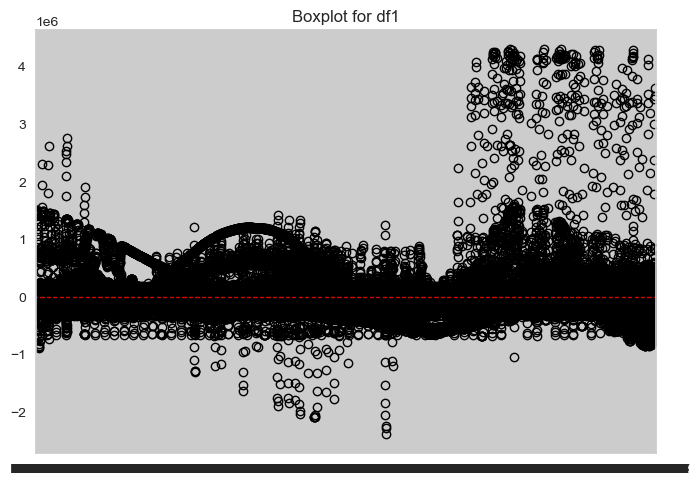

In [ ]:

plt.figure(figsize=(25, 25))
df1.plot.box(title="Boxplot for df1")

<AxesSubplot:title={'center':'Boxplot for df2'}>

<Figure size 2500x2500 with 0 Axes>

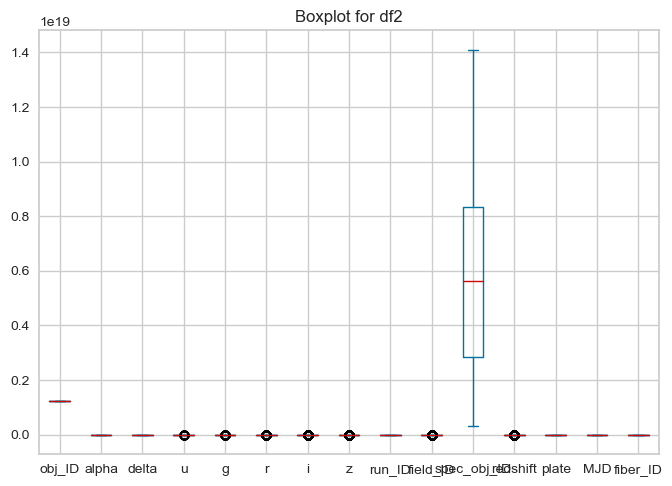

In [ ]:
plt.figure(figsize=(25, 25))
df2.plot.box(title="Boxplot for df2")

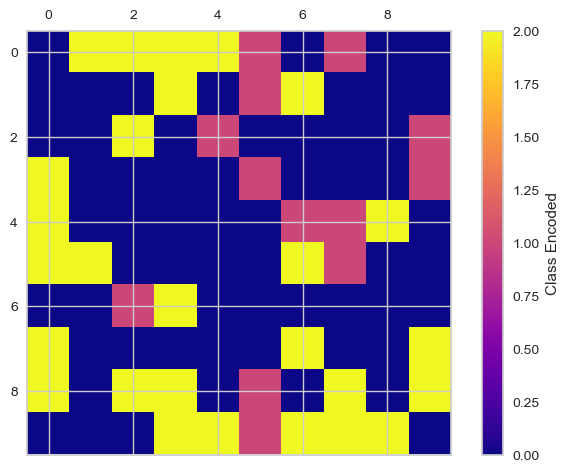

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
df2['class_encoded'] = label_encoder.fit_transform(df2['class'])
num_samples = 100
grid_height = 10
grid_width = 10
sample_data = df2['class_encoded'].sample(n=num_samples, random_state=42)

data_grid = np.reshape(sample_data.values, (grid_height, grid_width))

fig, ax = plt.subplots()

cax = ax.matshow(data_grid, cmap='plasma')

plt.colorbar(cax, label="Class Encoded")

plt.show()


<Figure size 800x550 with 0 Axes>

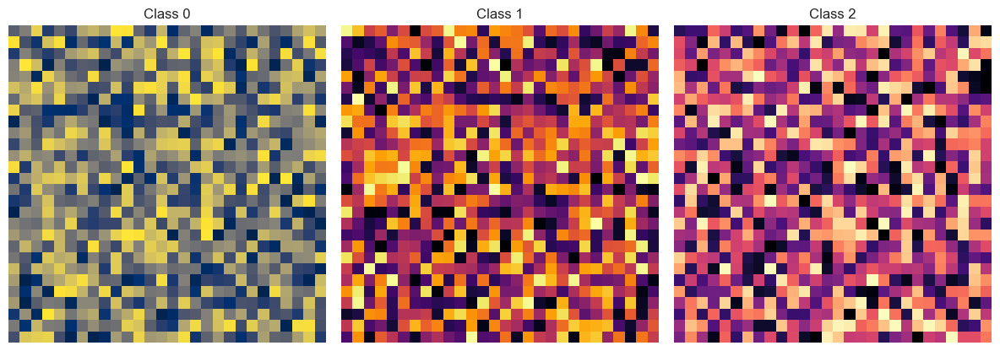

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
numeric_data = np.random.random((10, 28, 28))
class_labels = [0, 1, 2]

grid_height = 1
grid_width = 3

class_colors = {
    0: 'cividis',
    1: 'inferno',
    2: 'magma'

}

plt.clf()
fig, axes = plt.subplots(grid_height, grid_width, figsize=(12, 6))

axes = axes.ravel()
for i in range(grid_height * grid_width):
    ax = axes[i]
    ax.axis('off')

    if i < len(numeric_data):
        image = numeric_data[i]
        label = class_labels[i]
        color = class_colors.get(label, 'viridis')

        ax.imshow(image, cmap=color, aspect='equal')
        ax.set_title(f"Class {label}")
    else:
        ax.axis('off')

plt.tight_layout()
plt.show()


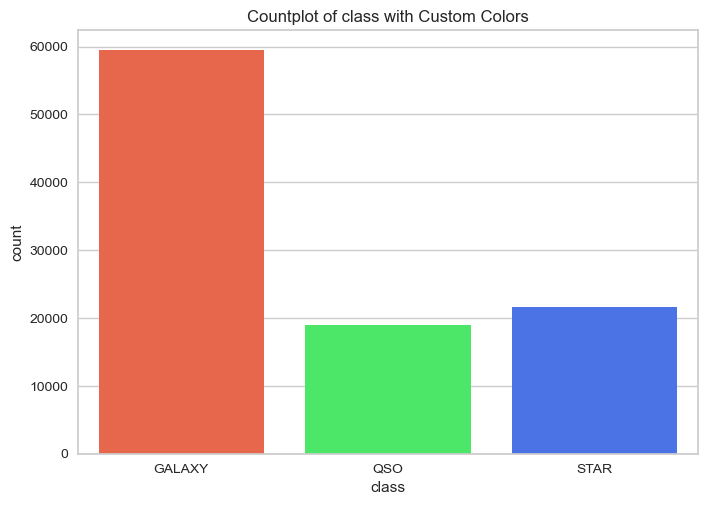

In [ ]:
custom_palette = ["#FF5733", "#33FF57", "#3366FF"]
category = "class"

plt.figure()
sns.countplot(x=category, data=df, palette=custom_palette)
plt.title(f'Countplot of {category} with Custom Colors')
plt.show()

In [ ]:
df["class"].value_counts()

GALAXY    59445
STAR      21594
QSO       18961
Name: class, dtype: int64

In [ ]:
df["class"]=[0 if i == "GALAXY" else 1 if i == "STAR" else 2 for i in df["class"]]

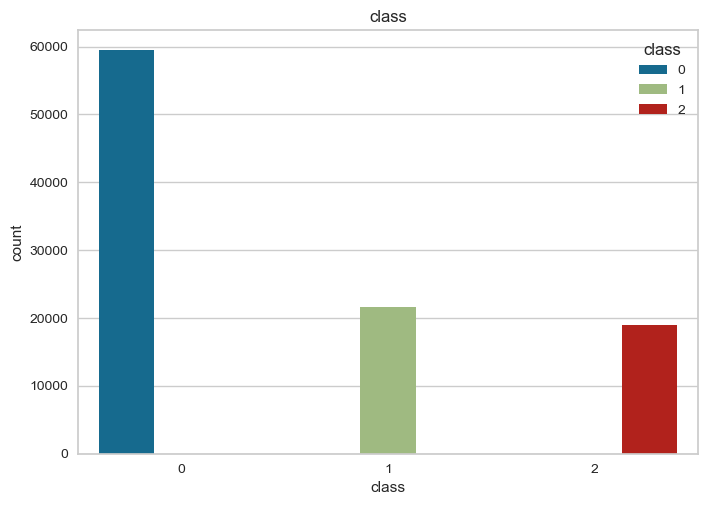

In [ ]:
cat=["class"]
df_cat = df.loc[:, cat]
for i in cat:
    plt.figure()
    sns.countplot(x = i, data = df_cat,hue = "class")
    plt.title(i)

In [ ]:
import plotly.express as ex
custom_colors = ["#FF5733", "#33FF57", "#3366FF"]
ex.pie(df,names='class',title='Distribution of the target variable. "Class"',hole=0.33,color_discrete_sequence=custom_colors)

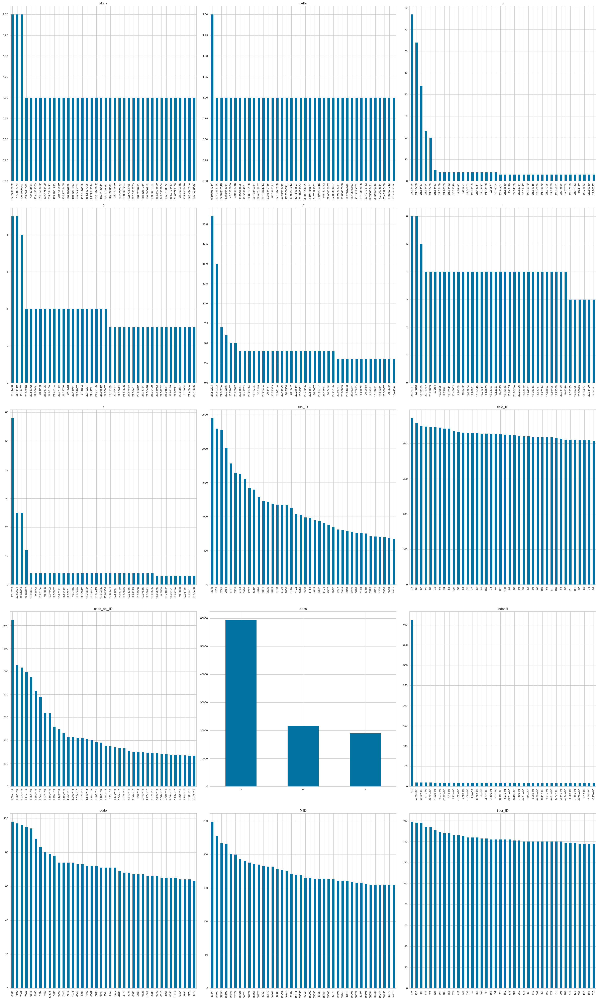

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

attributes = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID',  'field_ID', 'spec_obj_ID', 'class', 'redshift', 'plate', 'MJD', 'fiber_ID']

max_unique_values = 40
num_attributes = len(attributes)
num_cols = 3
num_rows = (num_attributes + num_cols - 1) // num_cols
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(30, 10 * num_rows))
for i, attr in enumerate(attributes):
    row = i // num_cols
    col = i % num_cols
    unique_values = df[attr].value_counts().head(max_unique_values)
    unique_values.plot(kind='bar', ax=axes[row, col])
    axes[row, col].set_title(attr)
plt.tight_layout()
plt.show()


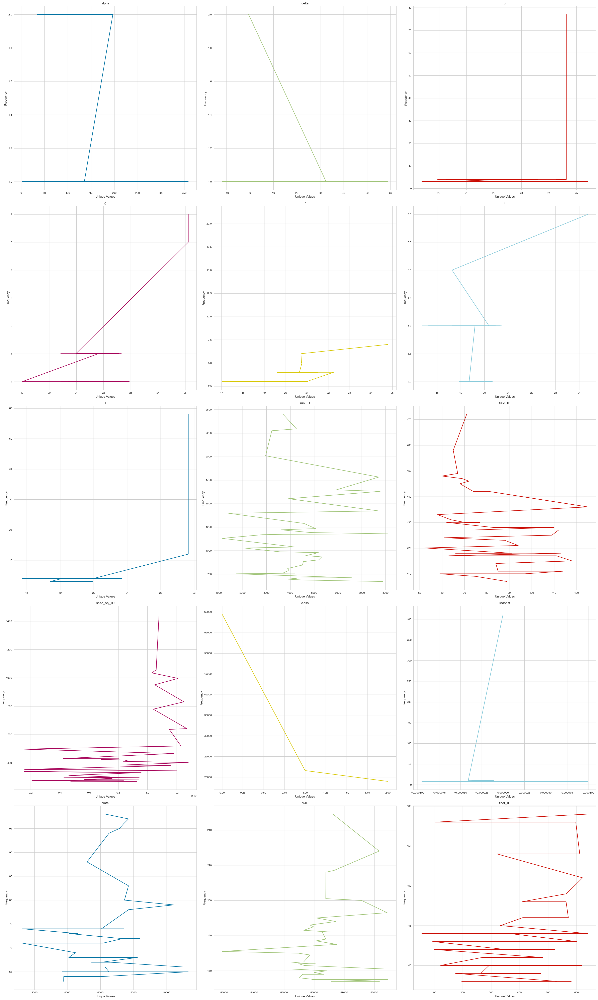

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from itertools import cycle


colors = cycle(plt.rcParams['axes.prop_cycle'].by_key()['color'])

attributes = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID', 'field_ID', 'spec_obj_ID', 'class', 'redshift', 'plate', 'MJD', 'fiber_ID']

max_unique_values = 40
num_attributes = len(attributes)
num_cols = 3
num_rows = (num_attributes + num_cols - 1) // num_cols
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(30, 10 * num_rows))
for i, attr in enumerate(attributes):
    row = i // num_cols
    col = i % num_cols
    unique_values = df[attr].value_counts().head(max_unique_values)
    unique_values.plot(kind='line', ax=axes[row, col], color=next(colors))  # Get the next color from the cycle
    axes[row, col].set_title(attr)
    axes[row, col].set_xlabel("Unique Values")
    axes[row, col].set_ylabel("Frequency")
plt.tight_layout()
plt.show()


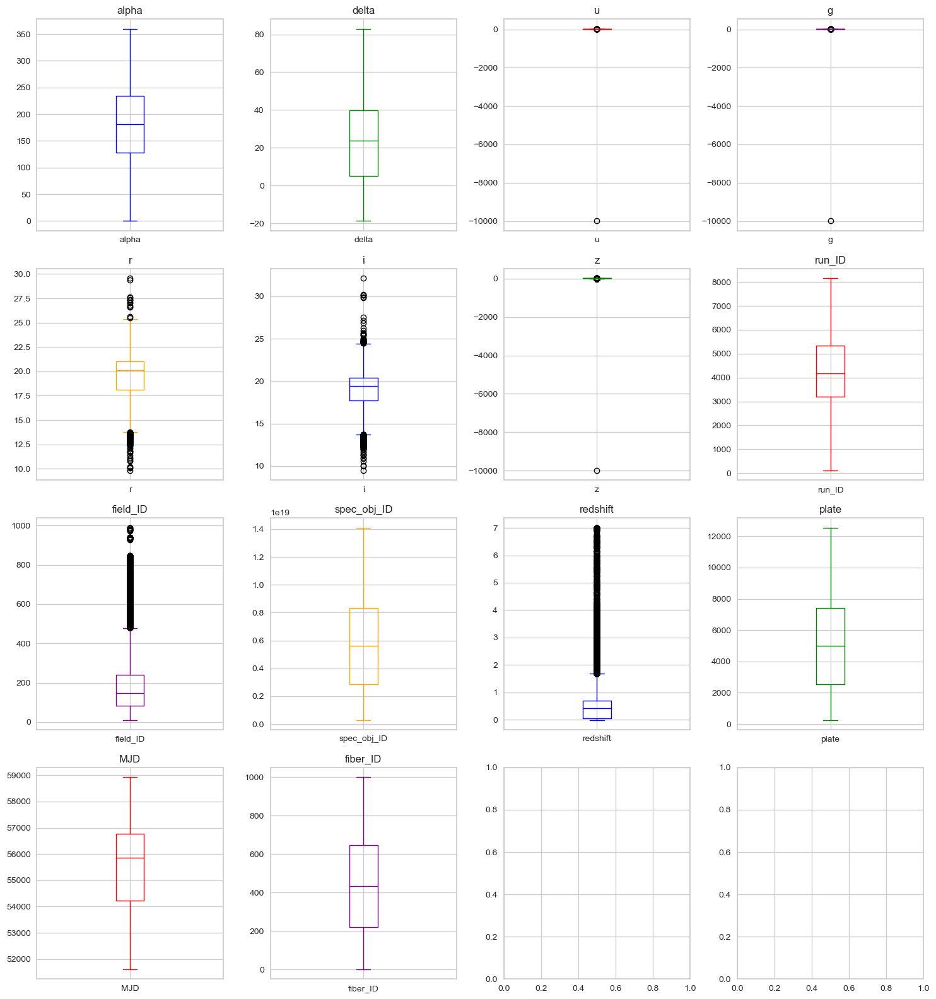

In [ ]:
import matplotlib.pyplot as plt

columns = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID',   'field_ID', 'spec_obj_ID', 'redshift', 'plate', 'MJD', 'fiber_ID']
num_columns = len(columns)
num_rows = (num_columns + 3) // 4
fig, axes = plt.subplots(nrows=num_rows, ncols=4, figsize=(15, 4 * num_rows))

colors = ['blue', 'green', 'red', 'purple', 'orange']
for i, column in enumerate(columns):
    ax = axes[i // 4, i % 4]
    df.boxplot(column=column, ax=ax, color=colors[i % len(colors)])
    ax.set_title(column)

plt.tight_layout()
plt.show()


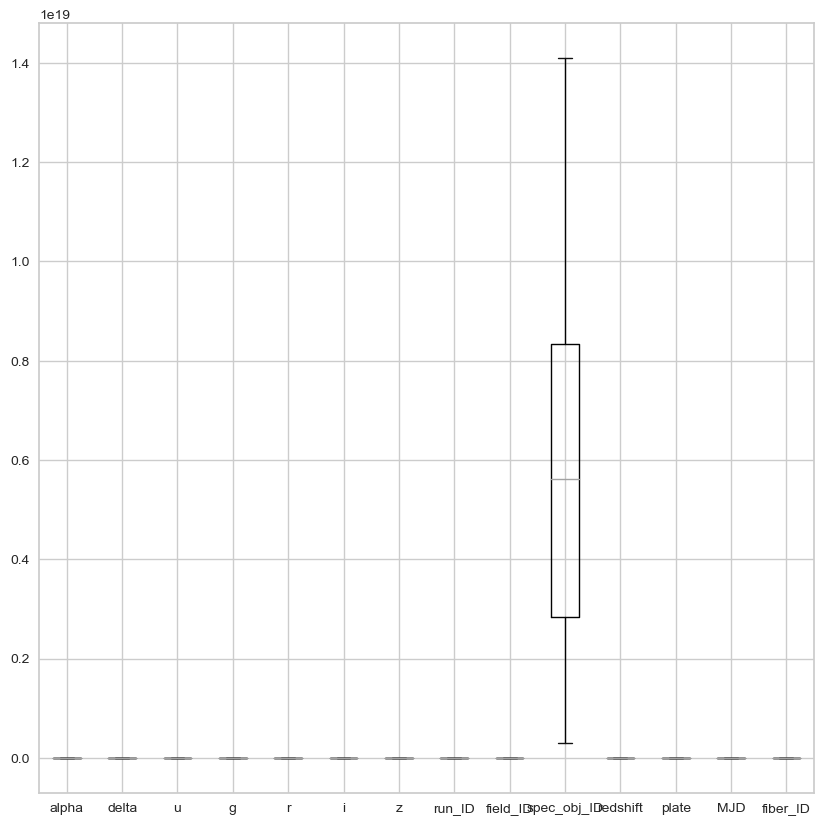

In [ ]:

columns = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID',  'field_ID', 'spec_obj_ID', 'redshift', 'plate', 'MJD', 'fiber_ID']
df.boxplot(column=columns, showfliers=False, figsize=(10, 10))
plt.show()

<AxesSubplot:ylabel='Frequency'>

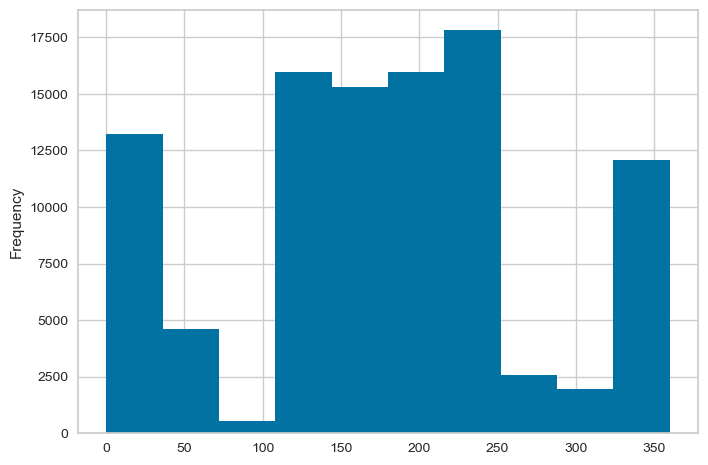

In [ ]:
df.alpha.plot.hist(bins=10)

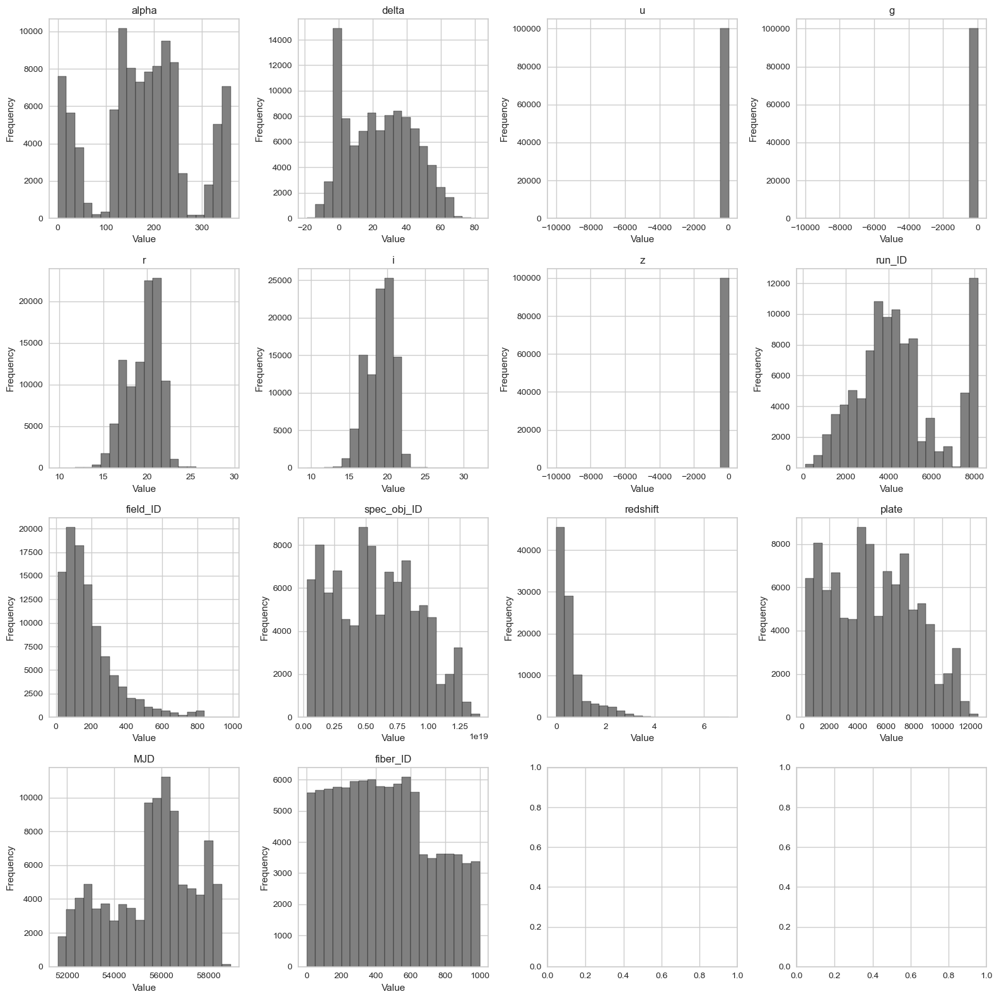

In [ ]:

columns = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID',   'field_ID', 'spec_obj_ID', 'redshift','plate', 'MJD', 'fiber_ID']
num_subplots_per_row = 4
num_rows = (len(columns) + num_subplots_per_row - 1) // num_subplots_per_row
fig, axes = plt.subplots(num_rows, num_subplots_per_row, figsize=(16, 4 * num_rows))
axes = axes.flatten()
for i, column in enumerate(columns):
    axes[i].hist(df[column], bins=20, color='grey', edgecolor='black')
    axes[i].set_title(column)
    axes[i].set_xlabel("Value")
    axes[i].set_ylabel("Frequency")
plt.tight_layout()
plt.show()

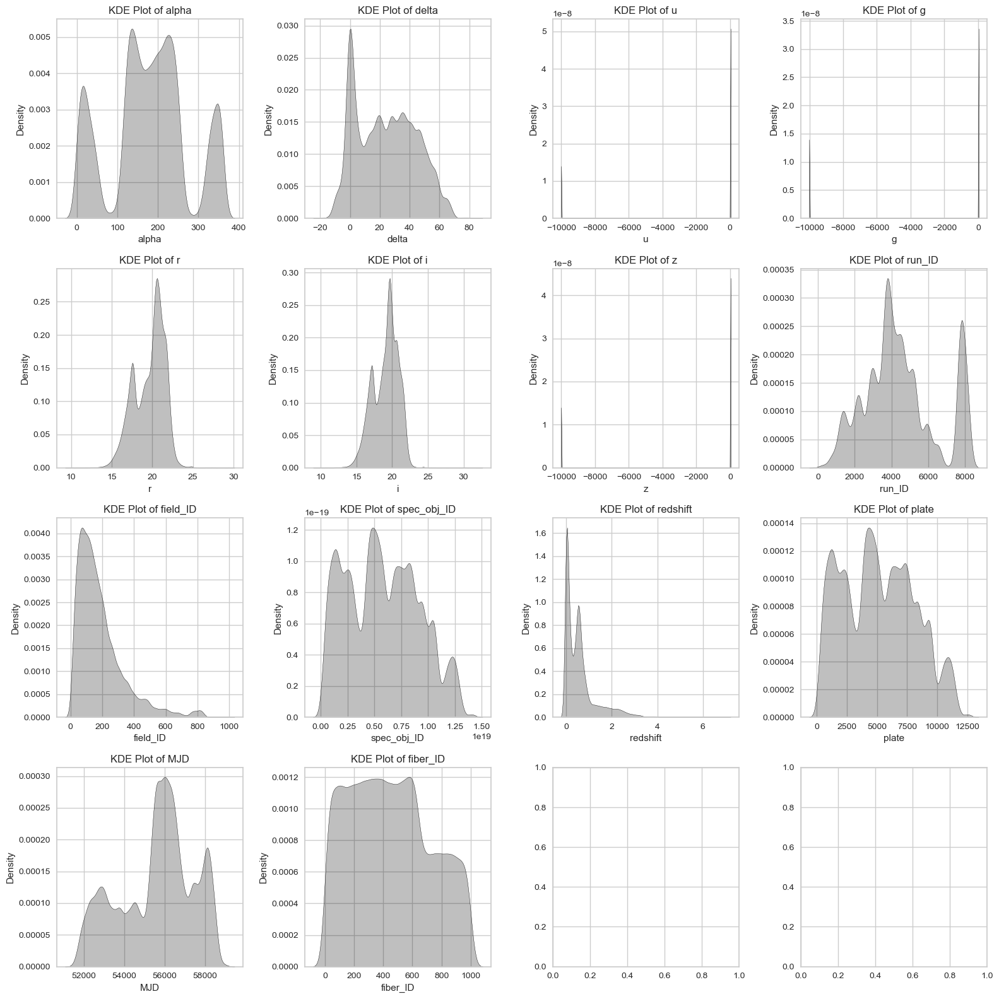

In [ ]:

columns = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID',   'field_ID', 'spec_obj_ID', 'redshift', 'plate', 'MJD', 'fiber_ID']
num_subplots_per_row = 4
num_rows = (len(columns) + num_subplots_per_row - 1) // num_subplots_per_row
fig, axes = plt.subplots(num_rows, num_subplots_per_row, figsize=(16, 4 * num_rows))
axes = axes.flatten()
for i, column in enumerate(columns):
    sns.kdeplot(data=df, x=column, ax=axes[i], color='black', fill=True)
    axes[i].set_title(f'KDE Plot of {column}')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel("Density")
plt.tight_layout()
plt.show()

<AxesSubplot:xlabel='alpha', ylabel='delta'>

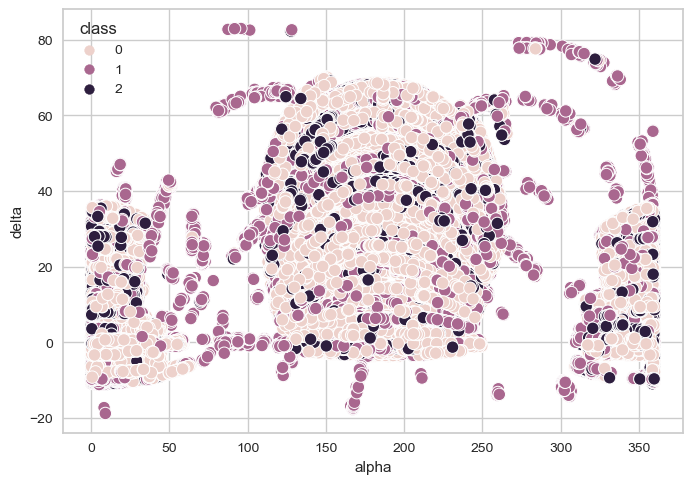

In [ ]:

sns.scatterplot(x='alpha',y ='delta',hue = 'class',data = df,s=80)

<AxesSubplot:xlabel='field_ID', ylabel='redshift'>

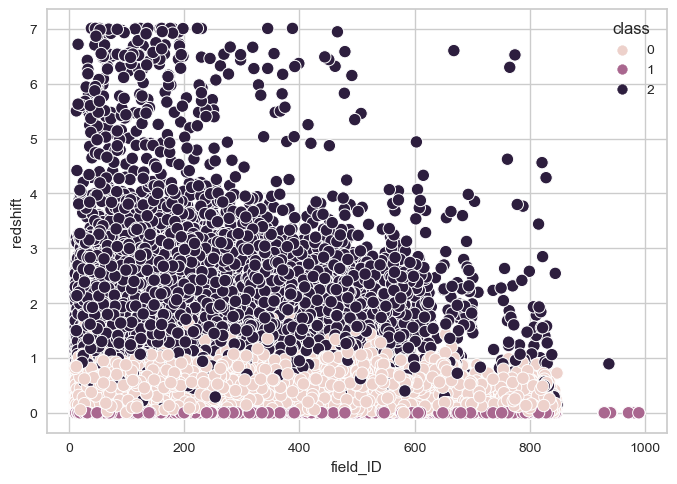

In [ ]:
sns.scatterplot(x='field_ID',y ='redshift',hue = 'class',data = df,s=80)

<AxesSubplot:xlabel='alpha', ylabel='run_ID'>

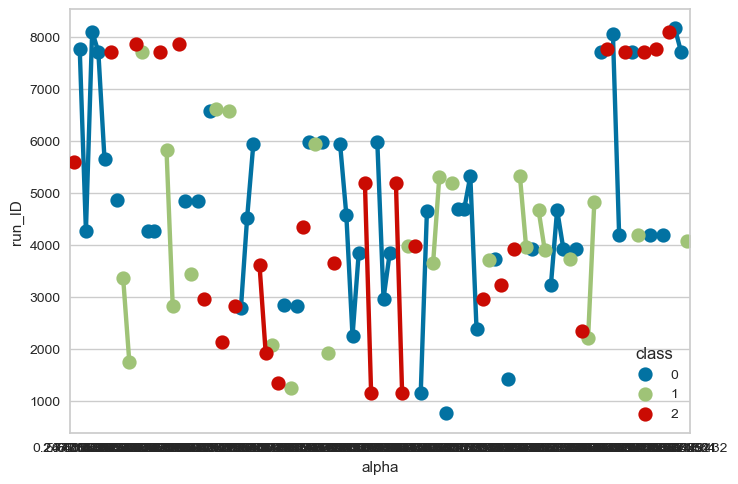

In [ ]:
sns.pointplot(x='alpha',y='run_ID',hue='class',data=df.sample(100))

<AxesSubplot:xlabel='z', ylabel='g'>

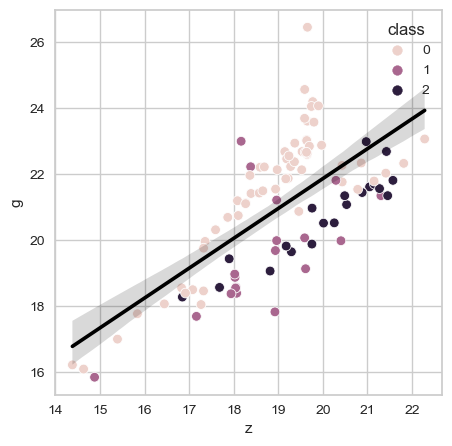

In [ ]:
sample_df = df.sample(100)
plt.figure(figsize=(5, 5))
sns.scatterplot(data=sample_df, x='z', y='g', hue='class')
sns.regplot(data=sample_df, x='z', y='g',scatter=False, color='black')

<AxesSubplot:xlabel='field_ID', ylabel='spec_obj_ID'>

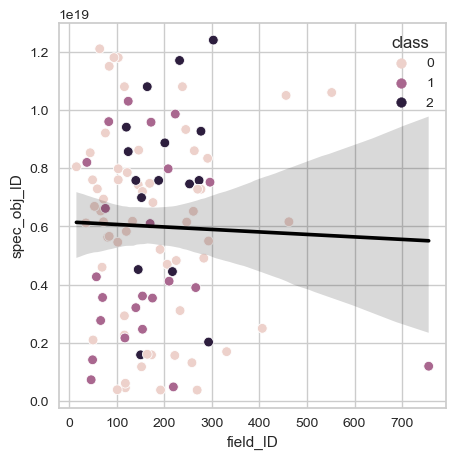

In [ ]:
sample_df = df.sample(100)
plt.figure(figsize=(5, 5))
sns.scatterplot(data=sample_df, x='field_ID', y='spec_obj_ID', hue='class')
sns.regplot(data=sample_df, x='field_ID', y='spec_obj_ID',scatter=False, color='black')

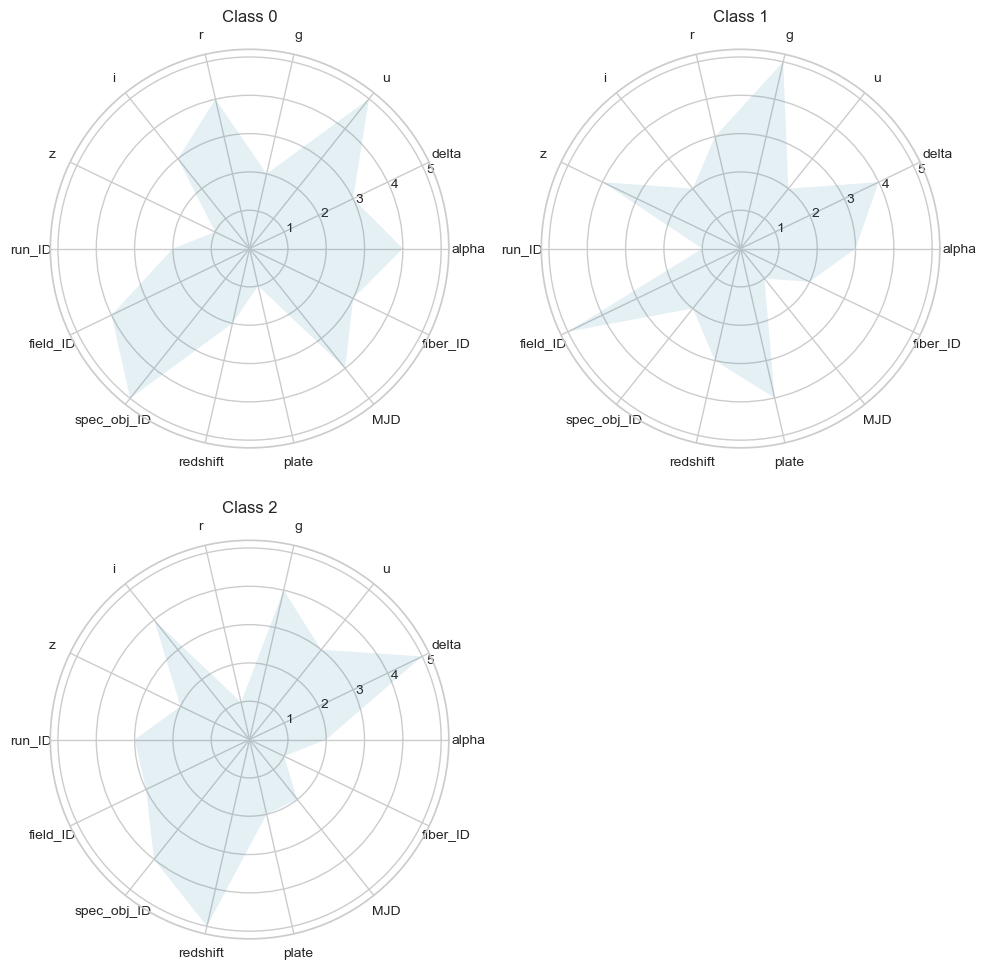

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

features = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID', 'field_ID', 'spec_obj_ID', 'redshift', 'plate', 'MJD', 'fiber_ID']

class_names = ['Class 0', 'Class 1', 'Class 2']

categories = features
values_per_class = [
    [4, 3, 5, 2, 4, 3, 1, 2, 4, 5, 2, 1, 4, 3],  # Replace with values for Class 0
    [3, 4, 2, 5, 3, 2, 4, 1, 5, 2, 3, 4, 1, 2],  # Replace with values for Class 1
    [2, 5, 3, 4, 1, 4, 2, 3, 3, 4, 5, 2, 2, 1],  # Replace with values for Class 2
]

num_categories = len(categories)

angles = np.linspace(0, 2 * np.pi, num_categories, endpoint=False).tolist()
angles += angles[:1]

plt.figure(figsize=(10, 10))
for i, class_name in enumerate(class_names):
    ax = plt.subplot(2, 2, i + 1, polar=True)
    ax.fill(angles, values_per_class[i] + values_per_class[i][:1], 'b', alpha=0.1)
    plt.title(class_name)
    plt.xticks(angles[:-1], categories)

plt.tight_layout()

plt.show()


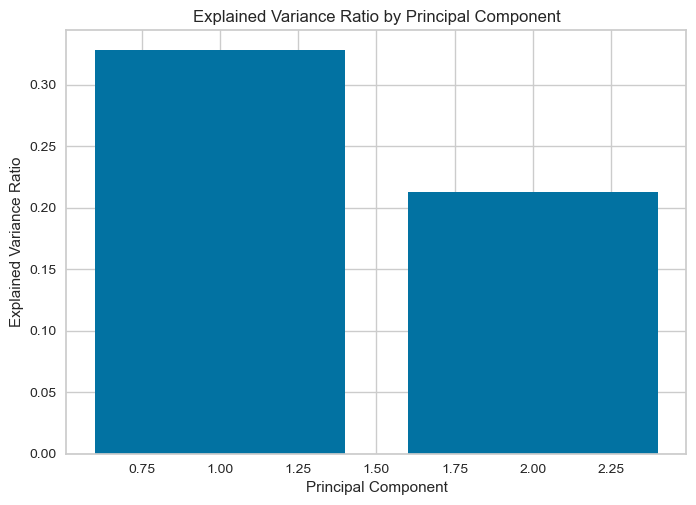

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

feature_columns = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID', 'field_ID', 'spec_obj_ID', 'redshift', 'plate', 'MJD', 'fiber_ID']

X = df[feature_columns]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
n_components = 2
pca = PCA(n_components=n_components)
X_pca = pca.fit_transform(X_scaled)
pca_df = pd.DataFrame(data=X_pca, columns=[f'PC{i}' for i in range(1, n_components + 1)])
explained_variance = pca.explained_variance_ratio_
plt.bar(range(1, n_components + 1), explained_variance)
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance Ratio by Principal Component')
plt.show()


In [ ]:
x = df.drop('class', axis=1)
y = df['class']

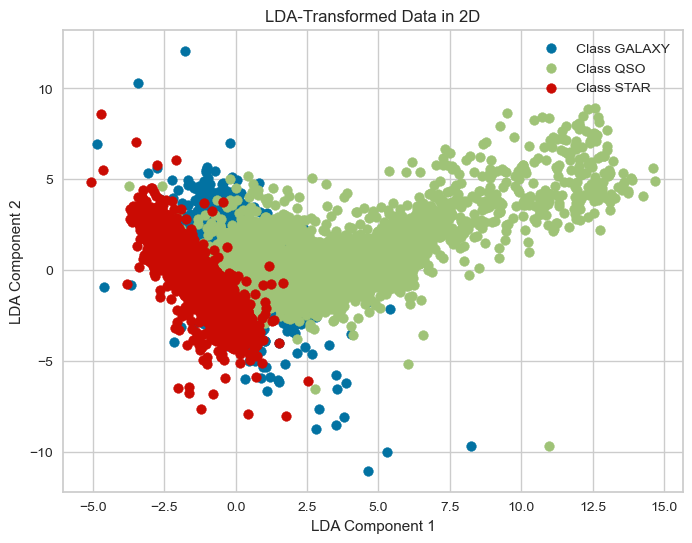

In [ ]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

lda = LinearDiscriminantAnalysis(n_components=2)
X_lda = lda.fit_transform(X, y)
plt.figure(figsize=(8, 6))
for class_label in df['class'].unique():
    plt.scatter(
        X_lda[y == class_label, 0],
        X_lda[y == class_label, 1],
        label=f'Class {class_label}'
    )

plt.xlabel('LDA Component 1')
plt.ylabel('LDA Component 2')
plt.legend()
plt.title('LDA-Transformed Data in 2D')

plt.show()


In [ ]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

features = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID', 'field_ID', 'spec_obj_ID', 'redshift', 'plate', 'MJD', 'fiber_ID']
target = 'class'
X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = MinMaxScaler()

X_train_scaled = scaler.fit_transform(X_train)

X_test_scaled = scaler.transform(X_test)

knn = KNeighborsClassifier(n_neighbors=5)

knn.fit(X_train_scaled, y_train)

y_pred = knn.predict(X_test_scaled)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')


Accuracy: 0.87


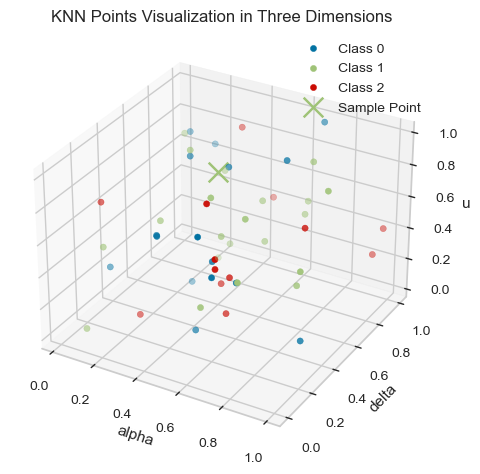

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

features = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID', 'field_ID', 'spec_obj_ID', 'redshift', 'plate', 'MJD', 'fiber_ID']

np.random.seed(0)
X = np.random.rand(50, len(features))
y = np.random.choice([0, 1, 2], size=50)

sample_point = np.array([0.4, 0.6, 0.8])


dimension_x = 0
dimension_y = 1
dimension_z = 2

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

for class_label in [0, 1, 2]:
    ax.scatter(X[y == class_label, dimension_x], X[y == class_label, dimension_y], X[y == class_label, dimension_z], label=f'Class {class_label}')

ax.scatter(sample_point[dimension_x], sample_point[dimension_y], sample_point[dimension_z], c='g', marker='x', s=200, label='Sample Point')

ax.set_xlabel(features[dimension_x])
ax.set_ylabel(features[dimension_y])
ax.set_zlabel(features[dimension_z])
ax.legend()
ax.set_title('KNN Points Visualization in Three Dimensions')
plt.show()


In [ ]:
features = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID', 'field_ID', 'spec_obj_ID', 'redshift', 'plate', 'MJD', 'fiber_ID']
target = 'class'
X = df[features]
y = df[target]


In [ ]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

features = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID', 'field_ID', 'spec_obj_ID', 'redshift', 'plate', 'MJD', 'fiber_ID']
target = 'class'
X = df[features]
y = df[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


svm = SVC(kernel='linear')

svm.fit(X_train_scaled, y_train)

y_pred = svm.predict(X_test_scaled)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')


Accuracy: 0.94


In [ ]:
from sklearn.metrics import classification_report
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = MinMaxScaler()

X_train_scaled = scaler.fit_transform(X_train)


In [ ]:
X_test_scaled = scaler.transform(X_test)

svm = SVC(kernel='linear')

svm.fit(X_train_scaled, y_train)

y_pred = svm.predict(X_test_scaled)

report = classification_report(y_test, y_pred, target_names=['Class 0', 'Class 1', 'Class 2'])

print(report)


              precision    recall  f1-score   support

     Class 0       0.95      0.96      0.95     11860
     Class 1       0.96      0.86      0.90      3797
     Class 2       0.92      0.97      0.95      4343

    accuracy                           0.94     20000
   macro avg       0.94      0.93      0.93     20000
weighted avg       0.94      0.94      0.94     20000



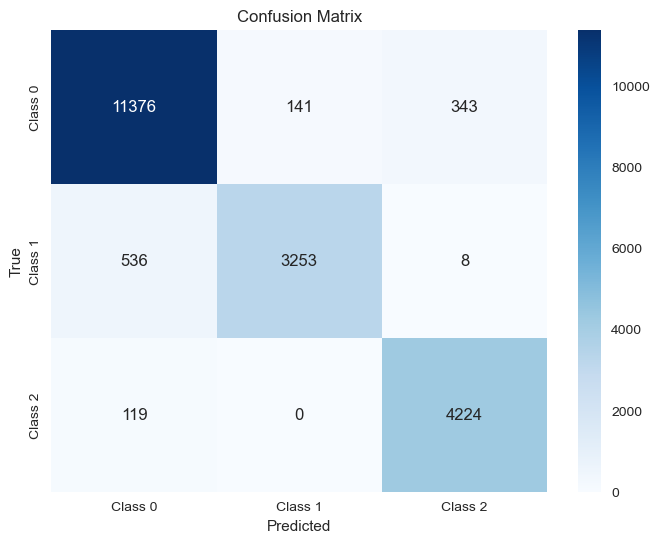

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)


plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Class 0', 'Class 1', 'Class 2'], yticklabels=['Class 0', 'Class 1', 'Class 2'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

C:\Users\Srijanya ch\anaconda3\lib\site-packages\sklearn\multiclass.py:84: UserWarning: Label not 0 is present in all training examples.
  warnings.warn(
C:\Users\Srijanya ch\anaconda3\lib\site-packages\sklearn\multiclass.py:84: UserWarning: Label not 1 is present in all training examples.
  warnings.warn(
C:\Users\Srijanya ch\anaconda3\lib\site-packages\sklearn\multiclass.py:84: UserWarning: Label not 2 is present in all training examples.
  warnings.warn(
C:\Users\Srijanya ch\anaconda3\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but _ConstantPredictor was fitted with feature names
  warnings.warn(
C:\Users\Srijanya ch\anaconda3\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but _ConstantPredictor was fitted with feature names
  warnings.warn(
C:\Users\Srijanya ch\anaconda3\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but _ConstantPredictor was fitted with

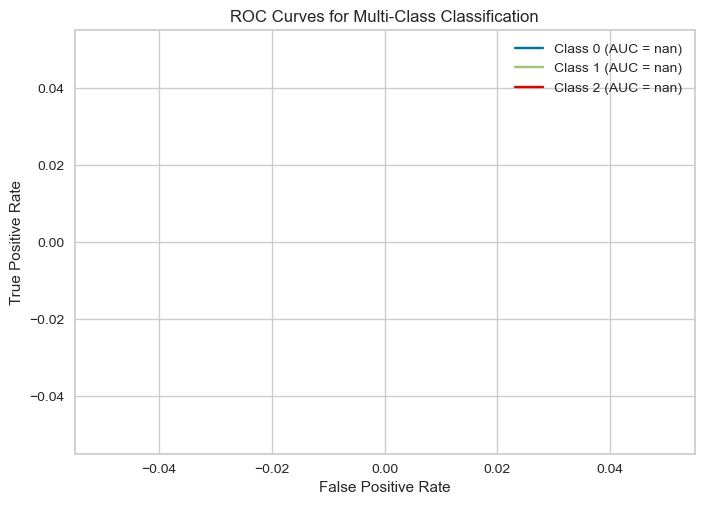

In [ ]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
import matplotlib.pyplot as plt
y_train_binarized = label_binarize(y_train, classes=[0, 1, 2])
y_test_binarized = label_binarize(y_test, classes=[0, 1, 2])

clf = OneVsRestClassifier(SVC())
clf.fit(X_train, y_train_binarized)
y_score = clf.decision_function(X_test_scaled)
fpr = {}
tpr = {}
roc_auc = {}
n_classes = y_train_binarized.shape[1]
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
plt.figure()
for i in range(n_classes):
      plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')  # Corrected f-string

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for Multi-Class Classification')
plt.legend(loc="best")
plt.show()


Accuracy with AdaBoost: 0.66


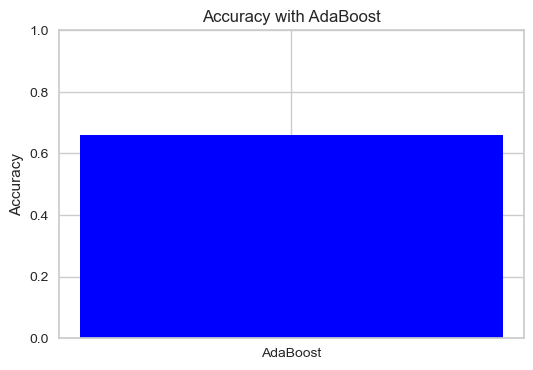

In [ ]:
import matplotlib.pyplot as plt
from sklearn.ensemble import AdaBoostClassifier

adaboost = AdaBoostClassifier(n_estimators=50, random_state=42)

adaboost.fit(X_train_scaled, y_train)


y_pred_adaboost = adaboost.predict(X_test_scaled)

accuracy_adaboost = accuracy_score(y_test, y_pred_adaboost)

print(f'Accuracy with AdaBoost: {accuracy_adaboost:.2f}')

plt.figure(figsize=(6, 4))
plt.bar(['AdaBoost'], [accuracy_adaboost], color='blue')
plt.ylabel('Accuracy')
plt.title('Accuracy with AdaBoost')
plt.ylim(0, 1.0)

plt.savefig('adaboost_accuracy.png')
plt.show()

In [ ]:
from sklearn.metrics import classification_report


class_names = ['Class 0', 'Class 1', 'Class 2']
report = classification_report(y_test, y_pred, target_names=class_names)
print(report)


              precision    recall  f1-score   support

     Class 0       0.95      0.96      0.95     11860
     Class 1       0.96      0.86      0.90      3797
     Class 2       0.92      0.97      0.95      4343

    accuracy                           0.94     20000
   macro avg       0.94      0.93      0.93     20000
weighted avg       0.94      0.94      0.94     20000



C:\Users\Srijanya ch\anaconda3\lib\site-packages\sklearn\metrics\_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
C:\Users\Srijanya ch\anaconda3\lib\site-packages\sklearn\metrics\_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
C:\Users\Srijanya ch\anaconda3\lib\site-packages\sklearn\metrics\_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


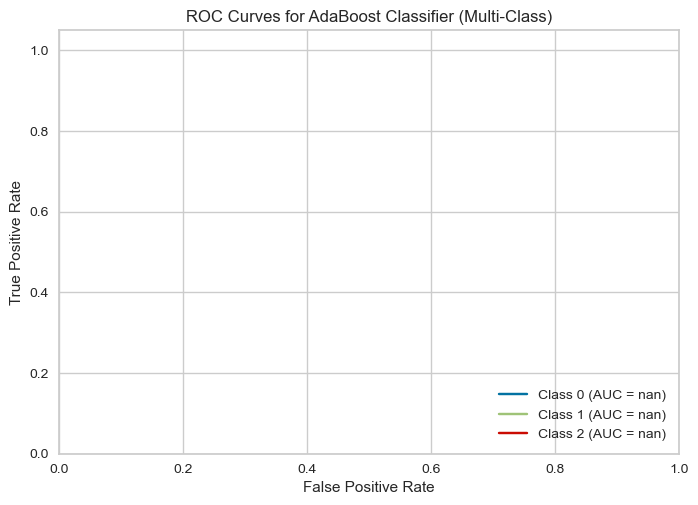

In [ ]:
import matplotlib.pyplot as plt
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

adaboost = AdaBoostClassifier(n_estimators=50, random_state=42)

adaboost.fit(X_train_scaled, y_train)

y_train_binarized = label_binarize(y_train, classes=[0, 1, 2])
y_test_binarized = label_binarize(y_test, classes=[0, 1, 2])


y_scores_adaboost = adaboost.decision_function(X_test_scaled)

fpr = {}
tpr = {}
roc_auc = {}
n_classes = y_train_binarized.shape[1]
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_scores_adaboost[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for AdaBoost Classifier (Multi-Class)')
plt.legend(loc="lower right")

plt.show()


In [ ]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

features = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID', 'field_ID', 'spec_obj_ID', 'redshift', 'plate', 'MJD', 'fiber_ID']
target = 'class'
X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

decision_tree = DecisionTreeClassifier(random_state=42)

decision_tree.fit(X_train, y_train)

y_pred = decision_tree.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')


Accuracy: 0.96


Accuracy: 0.96


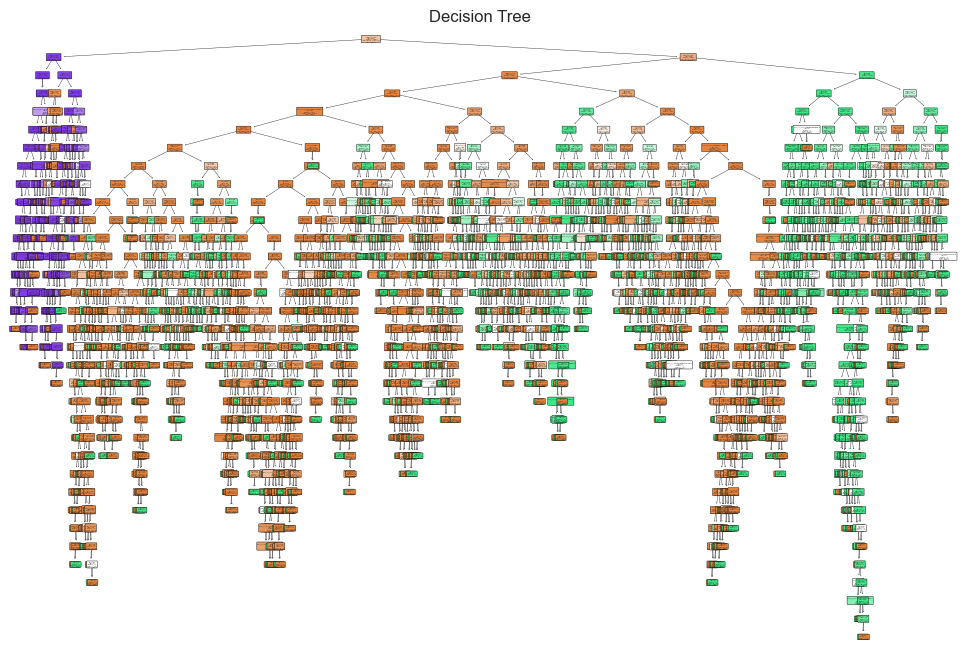

In [ ]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt

features = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID', 'field_ID', 'spec_obj_ID', 'redshift', 'plate', 'MJD', 'fiber_ID']
target = 'class'
X = df[features]
y = df[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

decision_tree = DecisionTreeClassifier(random_state=42)

decision_tree.fit(X_train, y_train)

y_pred = decision_tree.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')

plt.figure(figsize=(12, 8))
plot_tree(decision_tree, feature_names=features, class_names=['Class 0', 'Class 1', 'Class 2'], filled=True, rounded=True)
plt.title('Decision Tree')
plt.show()


In [ ]:
from sklearn.metrics import classification_report
y_pred = decision_tree.predict(X_test)

class_names = ['Class 0', 'Class 1', 'Class 2']
report = classification_report(y_test, y_pred, target_names=class_names)
print(report)

              precision    recall  f1-score   support

     Class 0       0.97      0.97      0.97     11860
     Class 1       0.91      0.91      0.91      3797
     Class 2       1.00      0.99      0.99      4343

    accuracy                           0.96     20000
   macro avg       0.96      0.96      0.96     20000
weighted avg       0.96      0.96      0.96     20000



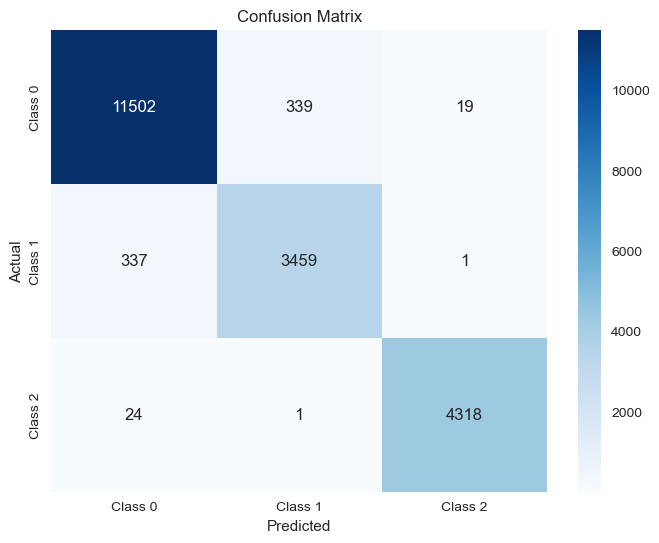

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

conf_matrix = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


C:\Users\Srijanya ch\anaconda3\lib\site-packages\sklearn\metrics\_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
C:\Users\Srijanya ch\anaconda3\lib\site-packages\sklearn\metrics\_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
C:\Users\Srijanya ch\anaconda3\lib\site-packages\sklearn\metrics\_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


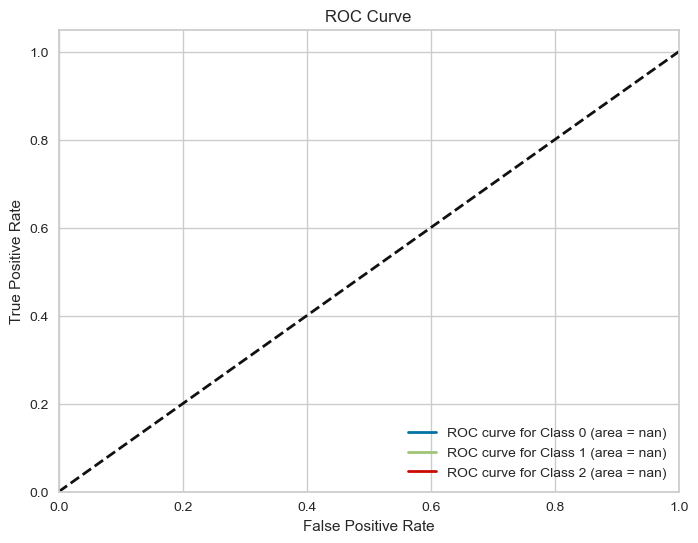

In [ ]:
from sklearn.metrics import roc_curve, auc

y_scores = decision_tree.predict_proba(X_test)
fpr = {}
tpr = {}
roc_auc = {}

for i in range(len(class_names)):
    fpr[i], tpr[i], _ = roc_curve(y_test, y_scores[:, i], pos_label=i)
    roc_auc[i] = auc(fpr[i], tpr[i])

plt.figure(figsize=(8, 6))
for i in range(len(class_names)):
    plt.plot(fpr[i], tpr[i], lw=2, label=f'ROC curve for {class_names[i]} (area = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()


In [ ]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
features = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID', 'field_ID', 'spec_obj_ID', 'redshift', 'plate', 'MJD', 'fiber_ID']
target = 'class'
X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

random_forest = RandomForestClassifier(n_estimators=100, random_state=42)

random_forest.fit(X_train_scaled, y_train)

y_pred = random_forest.predict(X_test_scaled)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')


Accuracy: 0.98


In [ ]:
from sklearn.metrics import classification_report


X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
random_forest = RandomForestClassifier(n_estimators=100, random_state=42)

random_forest.fit(X_train_scaled, y_train)

y_pred = random_forest.predict(X_test_scaled)

class_names = y.unique().astype(str)
report = classification_report(y_test, y_pred, target_names=class_names)

print(report)


              precision    recall  f1-score   support

      GALAXY       0.98      0.98      0.98     11860
         QSO       0.97      0.93      0.95      3797
        STAR       0.99      1.00      0.99      4343

    accuracy                           0.98     20000
   macro avg       0.98      0.97      0.97     20000
weighted avg       0.98      0.98      0.98     20000



In [ ]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

features = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID', 'field_ID', 'spec_obj_ID', 'redshift', 'plate', 'MJD', 'fiber_ID']
target = 'class'
X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

training_percentage = len(X_train) / len(X) * 100
testing_percentage = len(X_test) / len(X) * 100

print(f'Training Percentage: {training_percentage:.2f}%')
print(f'Testing Percentage: {testing_percentage:.2f}%')

Training Percentage: 80.00%
Testing Percentage: 20.00%


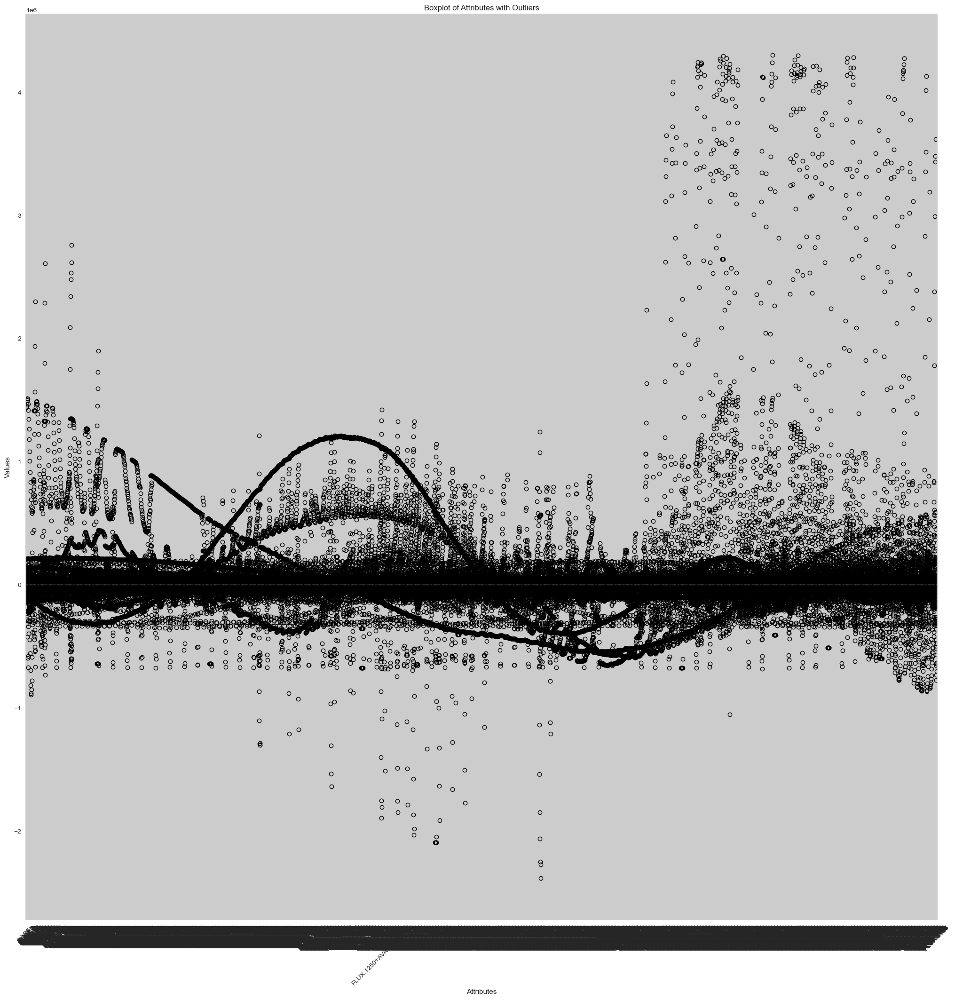

In [ ]:
plt.figure(figsize=(25, 25))
df1.boxplot()
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.title('Boxplot of Attributes with Outliers')
plt.xlabel('Attributes')
plt.ylabel('Values')

# Show the plot
plt.show()

In [ ]:
df1 = df.iloc[:, :3198]

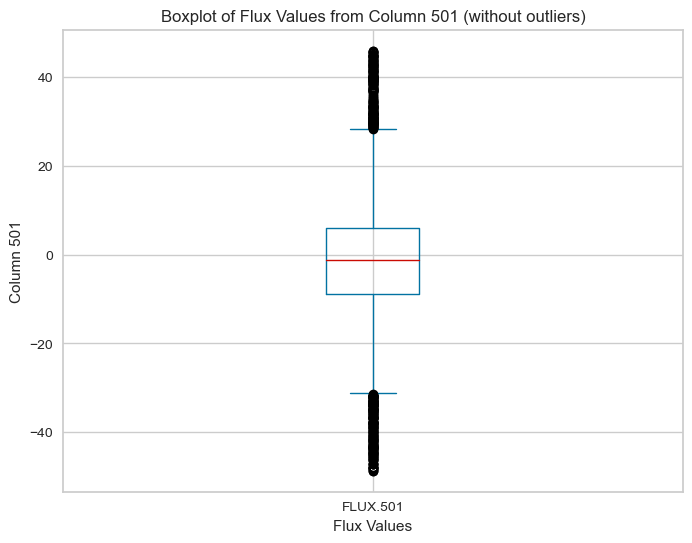

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt



# Select flux values from column 501
flux_501 = df1.iloc[:, 501]

# Remove outliers from flux_501
Q1 = flux_501.quantile(0.25)
Q3 = flux_501.quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
flux_501_no_outliers = flux_501[(flux_501 >= lower_bound) & (flux_501 <= upper_bound)]

# Create a box plot for flux_501 without outliers
plt.figure(figsize=(8, 6))
flux_501_no_outliers.plot.box()
plt.title('Boxplot of Flux Values from Column 501 (without outliers)')
plt.xlabel('Flux Values')
plt.ylabel('Column 501')
plt.grid(True)
plt.show()

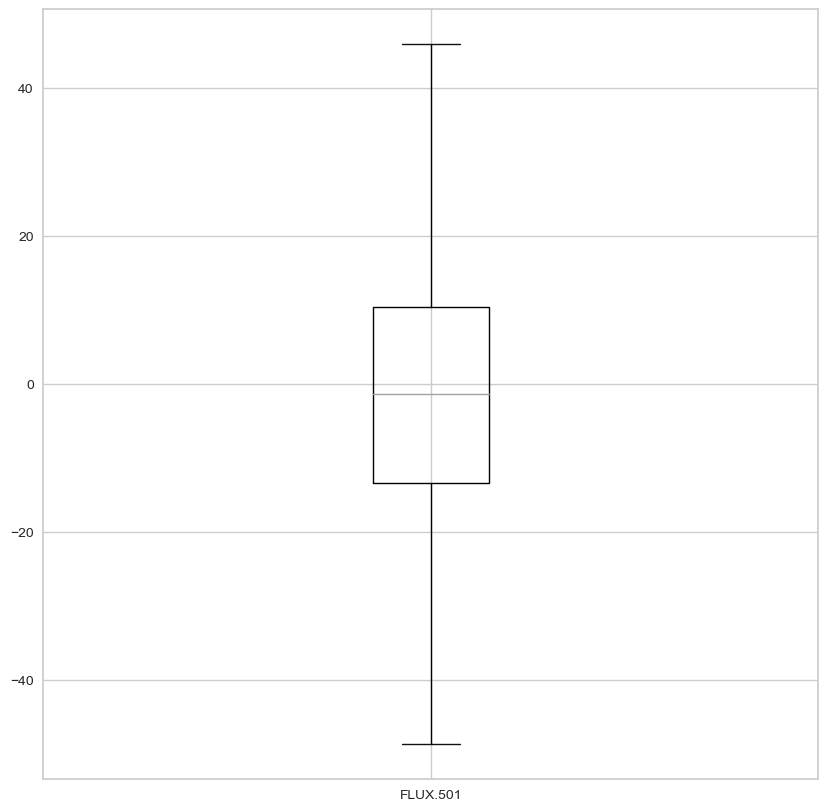

In [ ]:
columns = ['FLUX.501']
df.boxplot(column=columns, showfliers=False, figsize=(10, 10))
plt.show()

<AxesSubplot:>

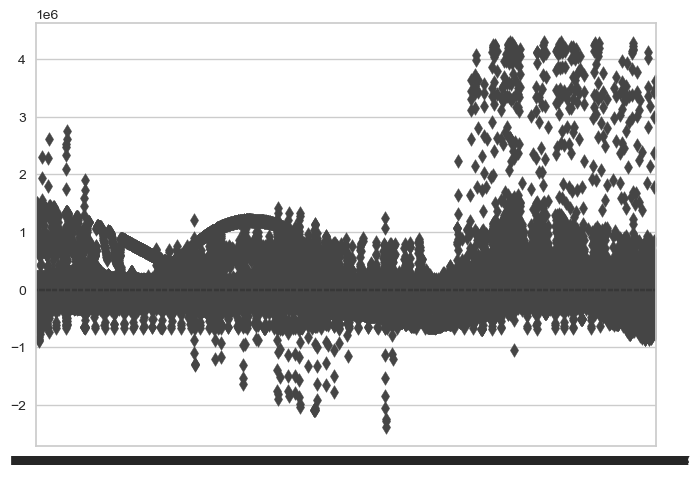

In [ ]:
sns.boxenplot(data=df1)

C:\Users\Srijanya ch\AppData\Local\Temp\ipykernel_23856\2233799334.py:14: FutureWarning: Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version. Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`
  df_no_outliers = df1[(df1 >= lower_bound) & (df1 <= upper_bound)]


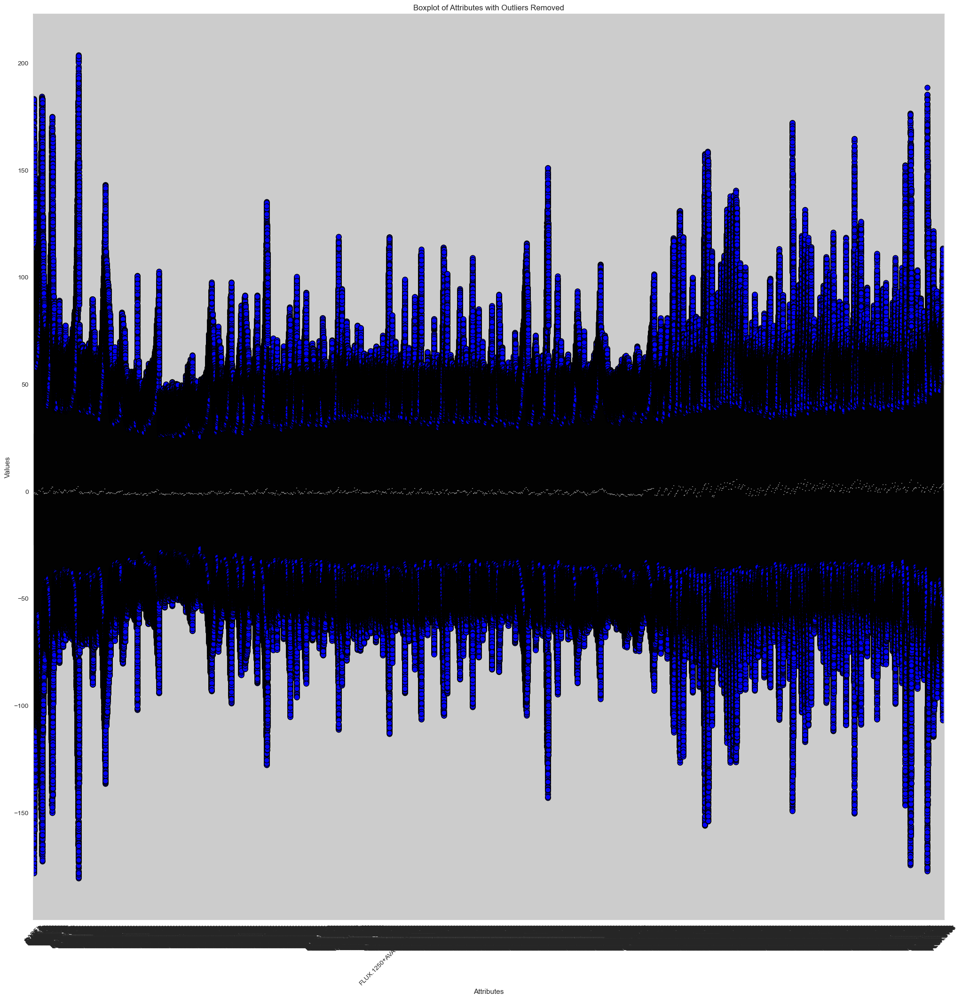

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
df1 = df.iloc[:, :3198]

def remove_outliers(df1):

    Q1 = df1.quantile(0.25)
    Q3 = df1.quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    df_no_outliers = df1[(df1 >= lower_bound) & (df1 <= upper_bound)]

    return df_no_outliers

df_no_outliers = remove_outliers(df1)

plt.figure(figsize=(25, 25))

# Create the boxplot with outliers (default color is black) and blue outliers
df_no_outliers.boxplot(showfliers=True, flierprops=dict(marker='o', markerfacecolor='blue', markersize=8, linestyle='none'))

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Set title and labels
plt.title('Boxplot of Attributes with Outliers Removed')
plt.xlabel('Attributes')
plt.ylabel('Values')

# Show the plot
plt.show()


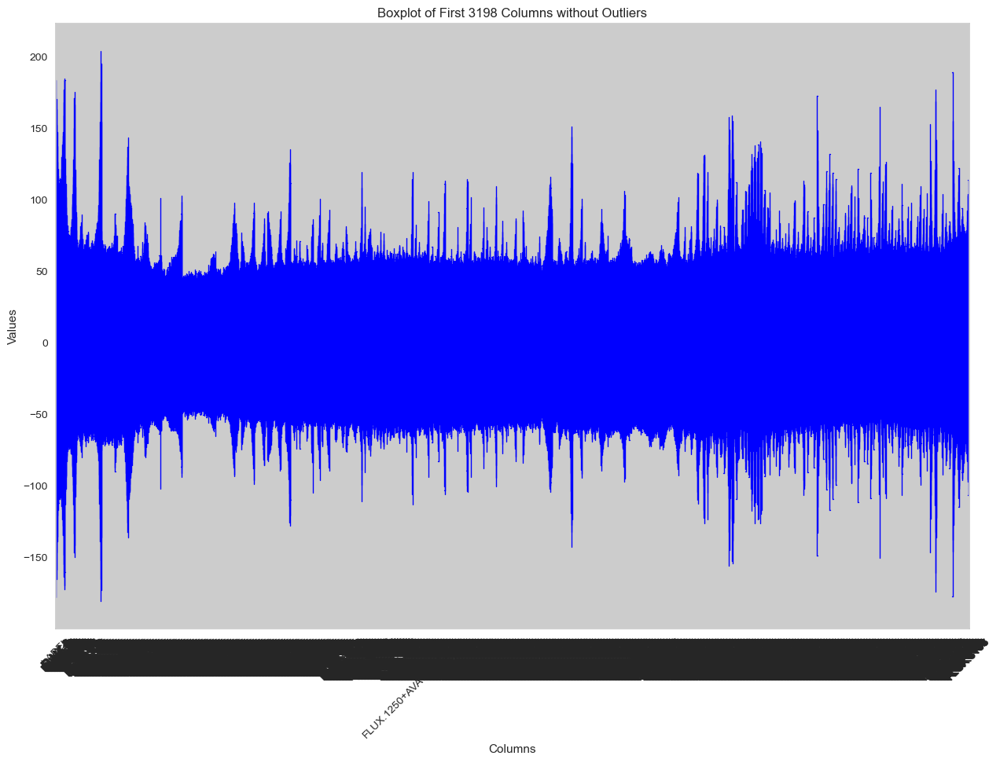

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming df is already defined elsewhere
df1 = df.iloc[:, :3198]

# Create a box plot for the selected columns, excluding outliers
df1.boxplot(showfliers=False, figsize=(15, 10), color='blue')

# Set plot title and labels
plt.title('Boxplot of First 3198 Columns without Outliers')
plt.xlabel('Columns')
plt.ylabel('Values')

# Rotate x-axis labels for better readability if necessary
plt.xticks(rotation=45)

# Show the plot
plt.show()


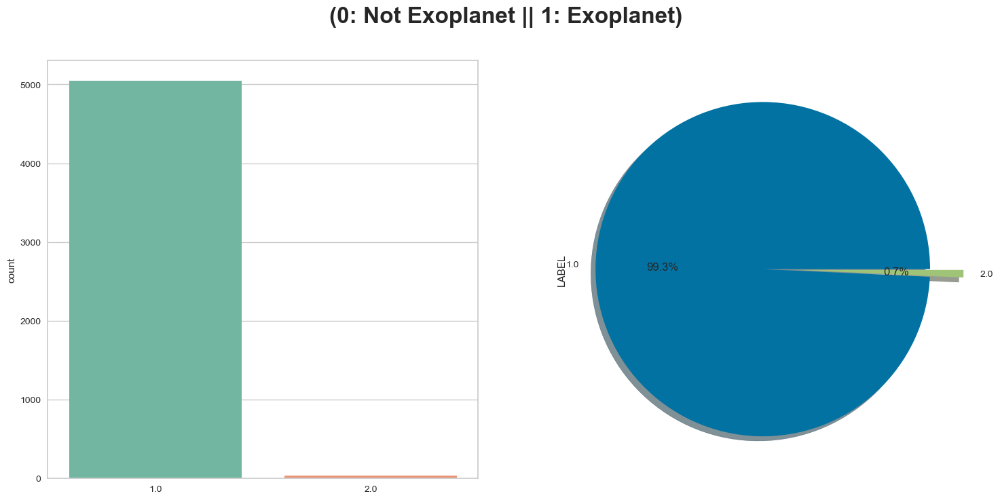

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'df' is defined as your DataFrame and 'y' contains the column name
y = 'LABEL'

# Plotting code
fig, ax = plt.subplots(1, 2, figsize=(18, 8))
sns.countplot(x=y, data=df1, palette="Set2", ax=ax[0])
ax[0].set_xlabel('')

# Calculate the value counts for the column specified by 'y'
value_counts = df1[y].value_counts()

# Determine the number of categories
num_categories = len(value_counts)

# Set explode parameter based on the number of categories
explode = [0.1] * num_categories

# Plot the pie chart with the correct explode parameter
value_counts.plot.pie(explode=explode, autopct='%1.1f%%', ax=ax[1], shadow=True)
fig.suptitle('(0: Not Exoplanet || 1: Exoplanet)\n', fontsize=24, fontweight='bold')

# Show the plot
plt.show()


In [ ]:
import plotly.express as ex
custom_colors = ["#FF5733", "#33FF57", "#3366FF"]
ex.pie(df1,names='LABEL',title='Distribution of the target variable. "LABEL"',hole=0.33,color_discrete_sequence=custom_colors)

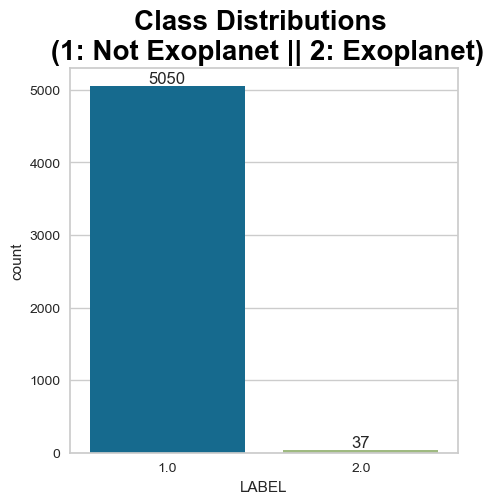

In [ ]:
#Visualization - Number of Stars with Confirmed Exoplanets or Not
#Label 1 - Exoplanet Confirmed, Label 0 - Exoplanet Not Confirmed
plt.figure(figsize = (5,5))
plt.title('Class Distributions \n (1: Not Exoplanet || 2: Exoplanet)', fontsize=20,
         font = 'sans serif', weight = 'bold', color = 'black')
ax = sns.countplot(data =df1, x='LABEL')
ax.bar_label(ax.containers[0])
plt.show()

In [ ]:
import random
df1 = df.iloc[:, :3198]

# Get a random index to select a star
random_index = random.randint(0, len(df1) - 1)

# Extract flux values for the random star
flux_values = df1.iloc[random_index, 1:].values  # Assuming the flux values start from the second column

# Adjust time range to match the dimensions of flux_values
time = range(1, len(flux_values) + 1)

# Plotting a random star from the DataFrame
plt.figure(figsize=(15, 5))
plt.title('Distribution of Flux Values for a Random Star', fontsize=20, font='sans serif', weight='bold', color='black')
plt.xlabel('Time')
plt.ylabel('Flux Intensity')
plt.plot(time, flux_values, linewidth=1)
plt.show()


MemoryError: Unable to allocate 2.38 GiB for an array with shape (3196, 100000) and data type float64

In [ ]:
# Define chunk size
chunk_size = 1000

# Initialize an empty list to store the chunks
chunks = []

# Read data in chunks and select a subset of columns
for chunk in pd.read_csv('exoTrain.csv', chunksize=chunk_size):
    subset_columns = chunk.columns[:1000]
    chunk_subset = chunk[subset_columns]
    chunks.append(chunk_subset)

# Concatenate the chunks into a single DataFrame
df_subset = pd.concat(chunks, ignore_index=True)

# Display the updated DataFrame
print(df_subset)


      LABEL   FLUX.1   FLUX.2   FLUX.3   FLUX.4   FLUX.5   FLUX.6  FLUX.7  \
0         2    93.85    83.81    20.10   -26.98   -39.56  -124.71 -135.18   
1         2   -38.88   -33.83   -58.54   -40.09   -79.31   -72.81  -86.55   
2         2   532.64   535.92   513.73   496.92   456.45   466.00  464.50   
3         2   326.52   347.39   302.35   298.13   317.74   312.70  322.33   
4         2 -1107.21 -1112.59 -1118.95 -1095.10 -1057.55 -1034.48 -998.34   
...     ...      ...      ...      ...      ...      ...      ...     ...   
5082      1   -91.91   -92.97   -78.76   -97.33   -68.00   -68.24  -75.48   
5083      1   989.75   891.01   908.53   851.83   755.11   615.78  595.77   
5084      1   273.39   278.00   261.73   236.99   280.73   264.90  252.92   
5085      1     3.82     2.09    -3.29    -2.88     1.66    -0.75    3.85   
5086      1   323.28   306.36   293.16   287.67   249.89   218.30  188.86   

       FLUX.8  FLUX.9  ...  FLUX.990  FLUX.991  FLUX.992  FLUX.993  FLUX.99

In [ ]:
#Dropping the label column and also plotting the graph - brightness over time
newdf = df_subset.drop(["LABEL"] ,axis = 1)
newdf

,FLUX.1,FLUX.2,FLUX.3,FLUX.4,FLUX.5,FLUX.6,FLUX.7,FLUX.8,FLUX.9,FLUX.10,...,FLUX.990,FLUX.991,FLUX.992,FLUX.993,FLUX.994,FLUX.995,FLUX.996,FLUX.997,FLUX.998,FLUX.999
0,93.85,83.81,20.10,-26.98,-39.56,-124.71,-135.18,-96.27,-79.89,-160.17,...,305.87,287.28,229.37,-70.24,-70.24,-37.36,71.31,35.98,33.78,12.08
1,-38.88,-33.83,-58.54,-40.09,-79.31,-72.81,-86.55,-85.33,-83.97,-73.38,...,-14.17,-16.54,-31.54,-46.43,-46.43,-51.67,-35.89,-36.01,-63.75,-43.68
2,532.64,535.92,513.73,496.92,456.45,466.00,464.50,486.39,436.56,484.39,...,161.08,168.45,166.02,101.20,101.20,140.77,135.25,106.97,106.64,86.56
3,326.52,347.39,302.35,298.13,317.74,312.70,322.33,311.31,312.42,323.33,...,135.93,127.59,160.36,77.44,77.44,91.27,93.82,106.74,124.98,95.55
4,-1107.21,-1112.59,-1118.95,-1095.10,-1057.55,-1034.48,-998.34,-1022.71,-989.57,-970.88,...,25.76,40.04,110.77,-413.84,-413.84,-392.29,-374.95,-379.02,-399.98,-346.68
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5082,-91.91,-92.97,-78.76,-97.33,-68.00,-68.24,-75.48,-49.25,-30.92,-11.88,...,-24.57,-32.68,-50.84,-50.68,-71.48,-80.77,-64.93,-63.60,-44.08,-40.55
5083,989.75,891.01,908.53,851.83,755.11,615.78,595.77,458.87,492.84,384.34,...,138.30,185.19,227.44,139.37,99.66,98.16,39.44,45.22,-62.52,-153.31
5084,273.39,278.00,261.73,236.99,280.73,264.90,252.92,254.88,237.60,238.51,...,-12.47,19.14,15.12,1.88,9.89,35.96,32.96,58.64,25.42,23.42
5085,3.82,2.09,-3.29,-2.88,1.66,-0.75,3.85,-0.03,3.28,6.29,...,-1.03,-3.04,-4.17,1.46,0.87,-4.48,-5.46,3.19,-3.39,4.54


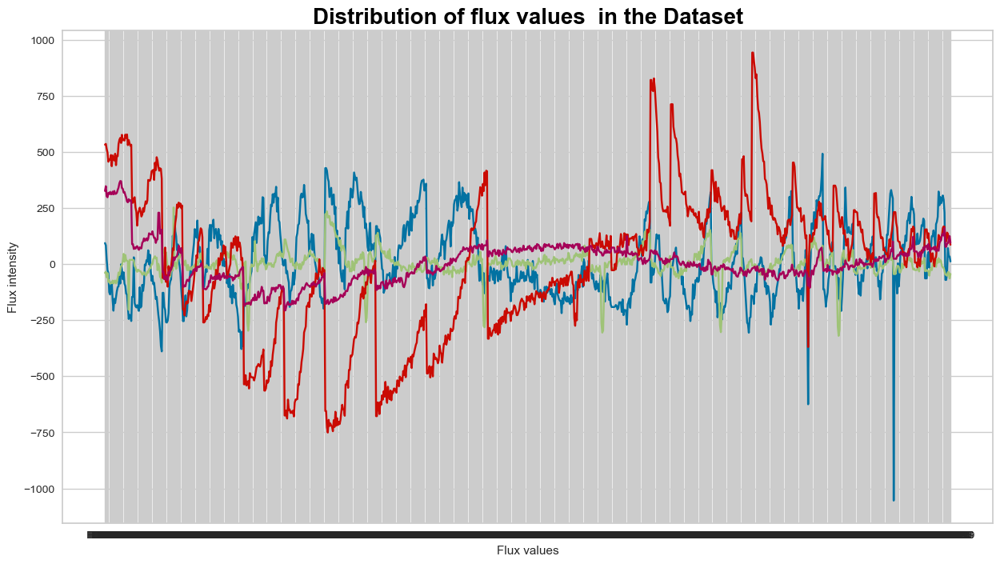

In [ ]:
plt.figure(figsize=(15,8))
plt.title('Distribution of flux values  in the Dataset', fontsize=20,
          font = 'sans serif', weight = 'bold', color = 'black')
plt.xlabel('Flux values')
plt.ylabel('Flux intensity')
plt.plot(newdf.iloc[0,])
plt.plot(newdf.iloc[1,])
plt.plot(newdf.iloc[2,])
plt.plot(newdf.iloc[3,])
plt.show()